In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import tensorflow as tf

print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available: 1


In [3]:
!pip install opencv-python-headless

import numpy as np
import pandas as pd
import os
import cv2 as cv
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt



In [4]:
pip install tensorflow

In [5]:
# Define Directories
base_dir = r'C:\Users\user\Downloads\archive\C-NMC_Leukemia'
train_folds = [
    os.path.join(base_dir, "training_data/fold_0"),
    os.path.join(base_dir, "training_data/fold_1"),
    os.path.join(base_dir, "training_data/fold_2"),
]

all_dirs = [os.path.join(fold, "all") for fold in train_folds]
hem_dirs = [os.path.join(fold, "hem") for fold in train_folds]

In [6]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Define the dataset path (Update this if your folder name is different)
base_dir = "/content/drive/MyDrive/DL/C-NMC_Leukemia"


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
if os.path.exists(base_dir):
    print("✅ Dataset folder found!")
    print("Contents:", os.listdir(base_dir))
else:
    print("❌ Dataset folder NOT found! Please check the path in Google Drive.")


✅ Dataset folder found!
Contents: ['validation_data', 'testing_data', 'training_data']


In [8]:
train_data_path = os.path.join(base_dir, "training_data")

if os.path.exists(train_data_path):
    print("✅ training_data folder found!")
    print("Contents:", os.listdir(train_data_path))
else:
    print("❌ training_data folder NOT found! Check your dataset structure.")


✅ training_data folder found!
Contents: ['fold_2', 'fold_0', 'fold_1']


In [9]:
# Define Directories
base_dir = "/content/drive/MyDrive/DL/C-NMC_Leukemia"
train_folds = [
    os.path.join(base_dir, "training_data/fold_0"),
    os.path.join(base_dir, "training_data/fold_1"),
    os.path.join(base_dir, "training_data/fold_2"),
]

all_dirs = [os.path.join(fold, "all") for fold in train_folds]
hem_dirs = [os.path.join(fold, "hem") for fold in train_folds]

In [10]:
# Get Image Paths and Labels
def get_image_paths(folder):
    return [os.path.join(folder, fname) for fname in os.listdir(folder)]

img_data = []
for folder in all_dirs + hem_dirs:
    img_data.extend(get_image_paths(folder))

data = pd.DataFrame({"img_data": img_data, "labels": [np.nan for _ in range(len(img_data))]})
data.loc[0:7271, "labels"] = 1  # ALL
data.loc[7272:10660, "labels"] = 0  # HEM
data["labels"] = data["labels"].astype("int64")

In [11]:
import os
import pandas as pd

# Define the base dataset directory
base_dir = "/content/drive/MyDrive/DL/C-NMC_Leukemia"

# Function to collect images from 'all' and 'hem' folders inside each fold
def get_images_from_folds(base_path):
    img_paths = []
    labels = []

    for fold in ["fold_0", "fold_1", "fold_2"]:
        fold_path = os.path.join(base_path, "training_data", fold)

        # Dynamically handle case variations
        all_path = os.path.join(fold_path, "all")
        hem_path = os.path.join(fold_path, "hem")

        # Collect 'all' images (label 1)
        if os.path.exists(all_path):
            all_images = [os.path.join(all_path, f) for f in os.listdir(all_path) if os.path.isfile(os.path.join(all_path, f))]
            img_paths.extend(all_images)
            labels.extend([1] * len(all_images))

        # Collect 'hem' images (label 0)
        if os.path.exists(hem_path):
            hem_images = [os.path.join(hem_path, f) for f in os.listdir(hem_path) if os.path.isfile(os.path.join(hem_path, f))]
            img_paths.extend(hem_images)
            labels.extend([0] * len(hem_images))

    return img_paths, labels

# Get training images and labels
train_images, train_labels = get_images_from_folds(base_dir)

# Check if images were found
if not train_images:
    raise FileNotFoundError("No training images found. Check dataset structure.")

# Create DataFrame
data = pd.DataFrame({"img_data": train_images, "labels": train_labels})

# Display dataset summary
print(f"Total training images: {len(data)}")
print(f"ALL class: {train_labels.count(1)} images")
print(f"HEM class: {train_labels.count(0)} images")
print(data.head())


Total training images: 150
ALL class: 75 images
HEM class: 75 images
                                            img_data  labels
0  /content/drive/MyDrive/DL/C-NMC_Leukemia/train...       1
1  /content/drive/MyDrive/DL/C-NMC_Leukemia/train...       1
2  /content/drive/MyDrive/DL/C-NMC_Leukemia/train...       1
3  /content/drive/MyDrive/DL/C-NMC_Leukemia/train...       1
4  /content/drive/MyDrive/DL/C-NMC_Leukemia/train...       1


In [12]:
import os

base_path = "/content/drive/MyDrive/DL/C-NMC_Leukemia"

# List contents of the main dataset folder
if os.path.exists(base_path):
    print("✅ Dataset folder found!")
    print("Contents of C-NMC_Leukemia:", os.listdir(base_path))
else:
    print("❌ Dataset folder NOT found! Check if it's uploaded correctly.")


✅ Dataset folder found!
Contents of C-NMC_Leukemia: ['validation_data', 'testing_data', 'training_data']


In [13]:
import os

train_path = "/content/drive/MyDrive/DL/C-NMC_Leukemia/training_data"

# List contents inside training_data
if os.path.exists(train_path):
    print("✅ Training data folder found!")
    print("Contents of training_data:", os.listdir(train_path))
else:
    print("❌ Training data folder NOT found! Check the path.")


✅ Training data folder found!
Contents of training_data: ['fold_2', 'fold_0', 'fold_1']


In [14]:
import os
import pandas as pd
import numpy as np

# Correct dataset path
base_path = "/content/drive/MyDrive/DL/C-NMC_Leukemia/training_data"

# Check folders inside training_data
print("Folders inside training_data:", os.listdir(base_path))

# Define paths for each fold
train_folds = [
    os.path.join(base_path, "fold_0"),
    os.path.join(base_path, "fold_1"),
    os.path.join(base_path, "fold_2"),
]

# Define class directories
all_dirs = [os.path.join(fold, "all") for fold in train_folds]
hem_dirs = [os.path.join(fold, "hem") for fold in train_folds]

# Function to get image paths safely
def get_image_paths(folder):
    if os.path.exists(folder):
        return [os.path.join(folder, fname) for fname in os.listdir(folder) if os.path.isfile(os.path.join(folder, fname))]
    else:
        print(f"❌ Warning: Directory not found - {folder}")
        return []

# Collect image paths
img_data = []
for folder in all_dirs + hem_dirs:
    img_data.extend(get_image_paths(folder))

# Ensure images are found
if not img_data:
    raise FileNotFoundError("No images found! Check dataset paths.")

# Create DataFrame
data = pd.DataFrame({"img_data": img_data})

# Assign labels based on folder names
data["labels"] = data["img_data"].apply(lambda x: 1 if "all" in x.lower() else 0)

print(f"✅ {len(img_data)} images loaded successfully!")
data.head()


Folders inside training_data: ['fold_2', 'fold_0', 'fold_1']
✅ 150 images loaded successfully!


,img_data,labels
0,/content/drive/MyDrive/DL/C-NMC_Leukemia/train...,1
1,/content/drive/MyDrive/DL/C-NMC_Leukemia/train...,1
2,/content/drive/MyDrive/DL/C-NMC_Leukemia/train...,1
3,/content/drive/MyDrive/DL/C-NMC_Leukemia/train...,1
4,/content/drive/MyDrive/DL/C-NMC_Leukemia/train...,1


In [15]:
# Get Image Paths and Labels
def get_image_paths(folder):
    return [os.path.join(folder, fname) for fname in os.listdir(folder)]

img_data = []
for folder in all_dirs + hem_dirs:
    img_data.extend(get_image_paths(folder))

data = pd.DataFrame({"img_data": img_data, "labels": [np.nan for _ in range(len(img_data))]})
data.loc[0:7271, "labels"] = 1  # ALL
data.loc[7272:10660, "labels"] = 0  # HEM
data["labels"] = data["labels"].astype("int64")

In [16]:
# Preprocessing and Loading Images
img_list = []
for path in data["img_data"]:
    image = cv.imread(path)
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    clahe = cv.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    gray = clahe.apply(gray)

    thresh = cv.threshold(gray, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)[1]
    kernel = np.ones((3, 3), np.uint8)
    thresh = cv.morphologyEx(thresh, cv.MORPH_OPEN, kernel, iterations=2)
    result = cv.bitwise_and(image, image, mask=thresh)
    result[thresh == 0] = [255, 255, 255]

    x, y, _ = np.where(result > 0)
    mnx, mxx = np.min(x), np.max(x)
    mny, mxy = np.min(y), np.max(y)
    crop_img = image[mnx:mxx, mny:mxy, :]
    crop_img_resized = cv.resize(crop_img, (224, 224))
    img_list.append(crop_img_resized)

X = np.array(img_list)
y = np.array(data["labels"])

In [17]:
import tensorflow as tf

print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available: 1


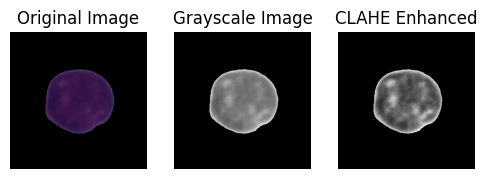

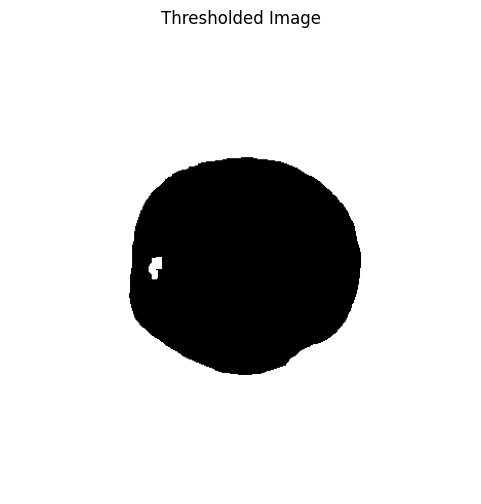

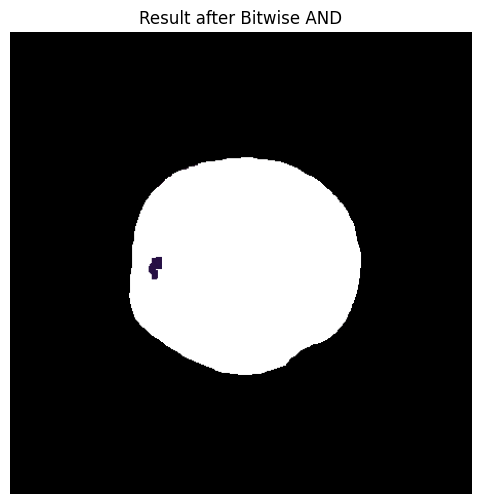

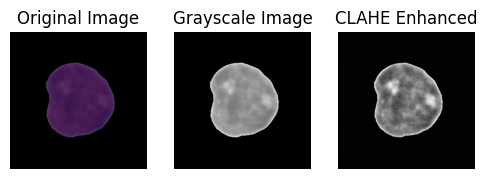

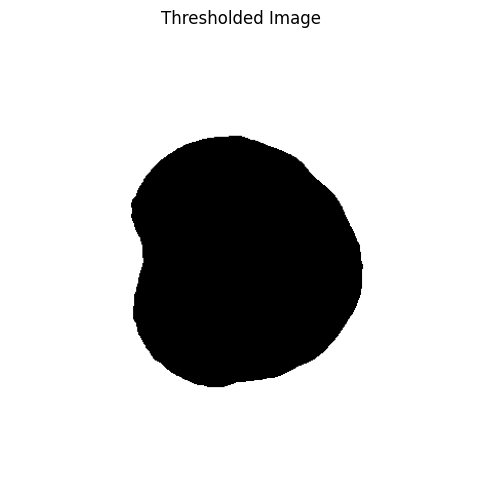

...

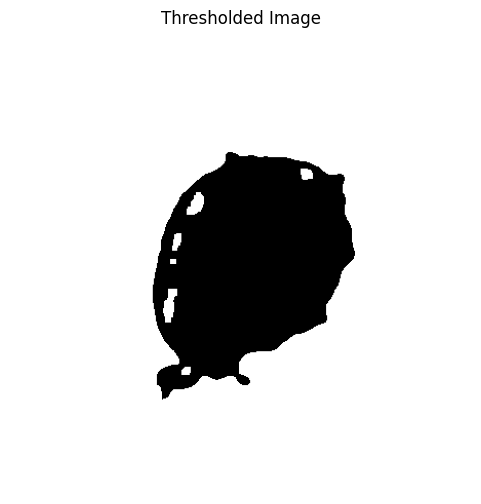

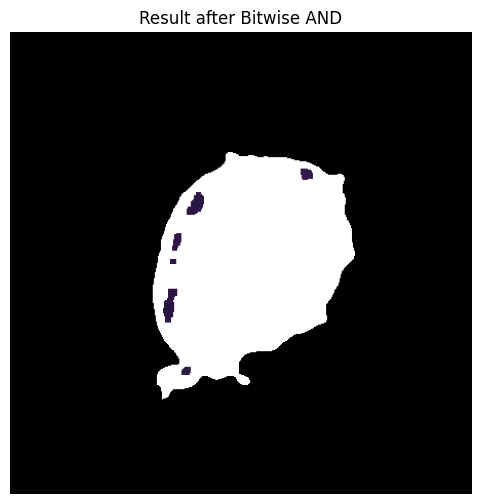

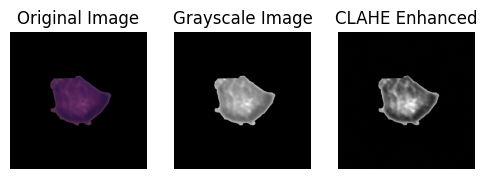

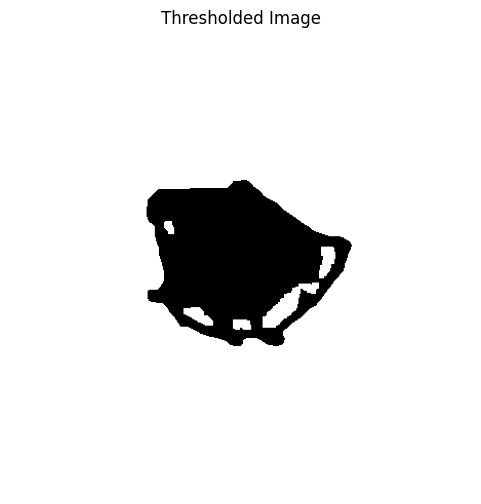

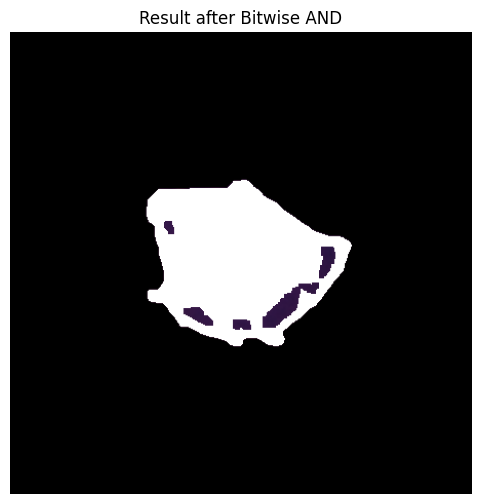

In [18]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_list = []
for path in data["img_data"]:
    image = cv.imread(path)

    # Display the original image
    plt.figure(figsize=(6,6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')

    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

    # Display grayscale image
    plt.subplot(1, 3, 2)
    plt.imshow(gray, cmap='gray')
    plt.title("Grayscale Image")
    plt.axis('off')

    clahe = cv.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    gray = clahe.apply(gray)

    # Display CLAHE enhanced grayscale image
    plt.subplot(1, 3, 3)
    plt.imshow(gray, cmap='gray')
    plt.title("CLAHE Enhanced")
    plt.axis('off')

    plt.show()

    thresh = cv.threshold(gray, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)[1]
    kernel = np.ones((3, 3), np.uint8)
    thresh = cv.morphologyEx(thresh, cv.MORPH_OPEN, kernel, iterations=2)
    # Display thresholded image
    plt.figure(figsize=(6,6))
    plt.imshow(thresh, cmap='gray')
    plt.title("Thresholded Image")
    plt.axis('off')
    plt.show()

    result = cv.bitwise_and(image, image, mask=thresh)
    result[thresh == 0] = [255, 255, 255]

    # Show the result after applying mask
    plt.figure(figsize=(6,6))
    plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
    plt.title("Result after Bitwise AND")
    plt.axis('off')
    plt.show()

    x, y, _ = np.where(result > 0)
    mnx, mxx = np.min(x), np.max(x)
    mny, mxy = np.min(y), np.max(y)
    crop_img = image[mnx:mxx, mny:mxy, :]
    crop_img_resized = cv.resize(crop_img, (224, 224))

    img_list.append(crop_img_resized)

X = np.array(img_list)
y = np.array(data["labels"])

In [19]:
print(len(X), len(y))  # Both should be the same

150 150


In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [21]:
# Preprocess Images for ResNet50
X_train = preprocess_input(X_train)
X_test = preprocess_input(X_test)

In [22]:
# Build and Compile the Model
base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss="binary_crossentropy",
              metrics=["accuracy"])

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [23]:
import tensorflow as tf

print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available: 1


In [24]:
# Callbacks
checkpoint = ModelCheckpoint("resnet50_leukemia_model.keras", monitor="val_accuracy", save_best_only=True, verbose=1)
early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True, verbose=1)

# Train the Model
history = model.fit(X_train, y_train,
                    validation_split=0.2,
                    epochs=15,
                    batch_size=32,
                    callbacks=[checkpoint, early_stopping],
                    verbose=1)

Epoch 1/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.5156 - loss: 0.9096
Epoch 1: val_accuracy improved from -inf to 0.83333, saving model to resnet50_leukemia_model.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 83s 6s/step - accuracy: 0.5352 - loss: 0.8732 - val_accuracy: 0.8333 - val_loss: 0.5269
Epoch 2/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - accuracy: 0.9306 - loss: 0.2303
Epoch 2: val_accuracy improved from 0.83333 to 1.00000, saving model to resnet50_leukemia_model.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9349 - loss: 0.2206 - val_accuracy: 1.0000 - val_loss: 0.1587
Epoch 3/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 1.0000 - loss: 0.0747
Epoch 3: val_accuracy did not improve from 1.00000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 435ms/step - accuracy: 1.0000 - loss: 0.0698 - val_accuracy: 1.0000 - val_loss: 0.0449
Epoch 4/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 1.0000 - loss: 0.0207
Epoch 4: val_accuracy did not improve from 1.00000
3/3 ━━━━━━━━━━━━━━━━

In [25]:
# Evaluate the Model
loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 1.0000 - loss: 1.1929e-04
Test Accuracy: 100.00%


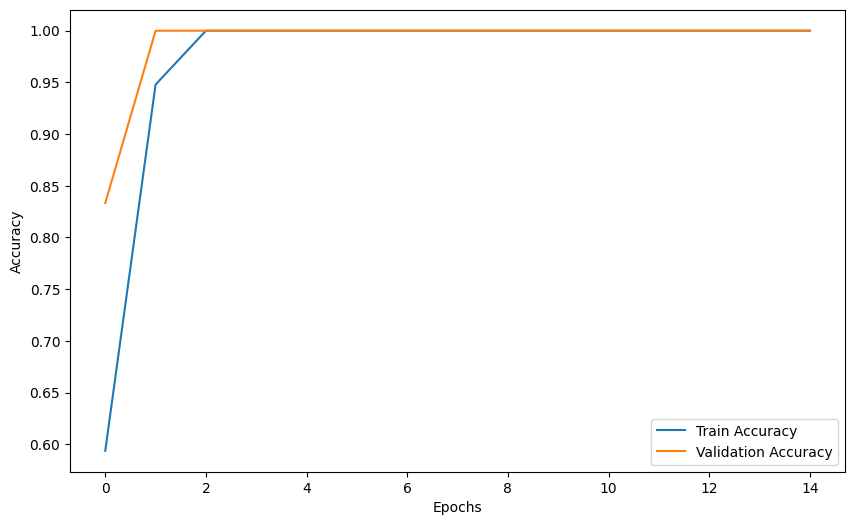

In [26]:
# Visualize Training History
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

model.save("resnet50_leukemia_final_model.h5")

In [32]:
import os

model_path = "/content/drive/MyDrive/DL/C-NMC_Leukemia/training_data/fold_0/all/UID_14_18_4_all.bmp"  # Update if needed
print("File Exists:", os.path.exists(model_path))


File Exists: True


In [43]:
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet50 import preprocess_input

# Load the trained model
model_path = "/content/resnet50_leukemia_final_model.h5"  # Update if needed
model = load_model(model_path)

# Image path
image_path = "/content/drive/MyDrive/DL/C-NMC_Leukemia/testing_data/C-NMC_test_final_phase_data/1256.bmp"

# Function to preprocess image
def preprocess_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Error: Could not read image at {image_path}")

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img = cv2.resize(img, (224, 224))  # Resize for ResNet50
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    img = preprocess_input(img)  # Normalize
    return img

# Preprocess the image
processed_img = preprocess_image(image_path)

# Make prediction
prediction = model.predict(processed_img)
predicted_class = np.argmax(prediction)  # Get the class index

# Map class to label
label = "Leukemia (ALL)" if predicted_class == 1 else "Healthy (HEM)"
print(f"Prediction: {label}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Prediction: Healthy (HEM)


In [44]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet50 import preprocess_input

# Load Model
model_path = "/content/resnet50_leukemia_final_model.h5"
model = load_model(model_path)

# Preprocessing Function
def preprocess_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    return img

# Classify Image
image_path = "/content/drive/MyDrive/DL/C-NMC_Leukemia/testing_data/C-NMC_test_final_phase_data/1247.bmp"
img = preprocess_image(image_path)

pred = model.predict(img)
print("Raw Prediction Output:", pred)

# Adjust prediction threshold based on activation function
if pred.shape[1] == 1:  # Binary Classification (Sigmoid)
    result = "Leukemia" if pred[0][0] > 0.5 else "Healthy"
else:  # Multi-Class Classification (Softmax)
    result = "Leukemia" if np.argmax(pred) == 1 else "Healthy"

print("Final Prediction:", result)


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Raw Prediction Output: [[0.99947554]]
Final Prediction: Leukemia
